# $$ \text{Shallow Water Project - Calcul Scientifique - Group 4} $$

$ $

$ $



$\hspace{9.4cm}$  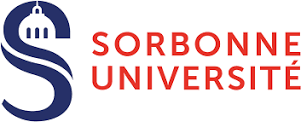





$ $

>>> $\underline{Authors}$ :       $\hspace{8cm}$ $\underline{Supervisors}$ : \\
Muhammad *FAIZOUD DIN ACKBARALLY* $\hspace{2.7cm}$ Jose Maria *FULLANA* \\
Jiayu *WANG*                      $\hspace{7.8cm}$ Anne *SERGENT* \\
Alexandre *RICHARD* \\
Kelana *BACHIR BRAHIM* \\
Valentin *DUVIVIVER* \\

$ $

In [ ]:
!apt install texlive-fonts-recommended texlive-fonts-extra cm-super dvipng        # latex libraries

Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following additional packages will be installed:
  cm-super-minimal fonts-adf-accanthis fonts-adf-berenis fonts-adf-gillius
  fonts-adf-universalis fonts-cabin fonts-comfortaa fonts-croscore
  fonts-crosextra-caladea fonts-crosextra-carlito fonts-dejavu-core
  fonts-dejavu-extra fonts-droid-fallback fonts-ebgaramond
  fonts-ebgaramond-extra fonts-font-awesome fonts-freefont-otf
  fonts-freefont-ttf fonts-gfs-artemisia fonts-gfs-complutum fonts-gfs-didot
  fonts-gfs-neohellenic fonts-gfs-olga fonts-gfs-solomos fonts-go
  fonts-junicode fonts-lato fonts-linuxlibertine fonts-lmodern fonts-lobster
  fonts-lobstertwo fonts-noto-hinted fonts-noto-mono fonts-oflb-asana-math
  fonts-open-sans fonts-roboto-hinted fonts-sil-gentium
  fonts-sil-gentium-basic fonts-sil-gentiumplus fonts-sil-gentiumplus-compact
  fonts-stix fonts-texgyre ghostscript gsfonts javascript-common
  libcupsfilters1 libcups

### **I. Shallow water model**

We propose to study a model of shallow water. We will go through theory behind the hyperbolic equations describing movement, describe discretization and then make a complete numerical resolution and study of obtained equations.

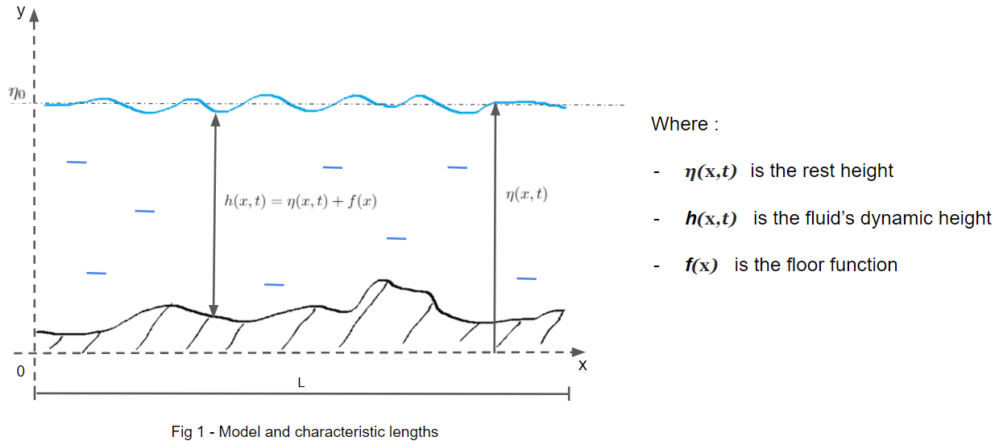

$\underline{\text{Domain}}$ : \\
- x $\in [0,L]$
- y $\in [f,h]$


$\underline{\text{Hypotheses}}$ : \\
We consider shallow water equation, i.e. a low height with respect to characteristic fluid's length along increasing x (as movement along $\underline{e_x}$).

Therefore, we assume :

$$ h \ll L ~~ \rightarrow ~~ \boxed{\epsilon = \dfrac{h}{L} \ll 1}$$

An additional hypothesis is to consider a domain where mass conservation is ensured, and therefore :

$$ div(\underline{u}) = 0 \equiv \dfrac{\partial u}{\partial x} + \dfrac{\partial v}{\partial y} = 0$$ and so under adimensionalized notation :

$$ \dfrac{U}{L}\dfrac{\partial \bar{u}}{\partial \bar{x}} + \dfrac{V}{h}\dfrac{\partial \bar{v}}{\partial \bar{y}} = 0 \Rightarrow V \approx \dfrac{h}{L}U = \epsilon U$$ \\

We then are to **neglect V** with respect to U component.


$\Rightarrow$ The fluid is thereby moving along $\underline{e_x}$, it doesn't depend on y variable and the speed :

$$\underline{V}(x,y,t) = u(x,y,t)\underline{e_x} + v(x,y,t)\underline{e_y}$$ \\

$$ \Rightarrow \underline{V}(x,y,t) = u(x,t)\underline{e_x}$$ \\

Let's furthermore detail the terms appearing in the fluid's equations before deriving them.

$\underline{\text{Fluid's equations}}$ : \\
- Viscous fluid $\rightarrow$ shearing effects
- Dynamic movement $\rightarrow$ fluid dynamic equation
- Submitted to volumic forces as gravity

If one writes Navier-Stokes equation taking the above hypotheses and components intp consideration, and by projection on $\underline{e_x}$, one obtains :

$$\rho(\dfrac{\partial u}{\partial t} + u\dfrac{\partial u}{\partial x}) = -\dfrac{\partial p}{\partial x} + \mu\dfrac{\partial^2 u}{\partial^2 x}$$

After a few manipulation and accounting for relations such as mass conservation, one eventually get a system of differential equations to solve, known as **Shallow Water Equations** :

\begin{align}
    \frac{\partial h}{\partial t} &+ \frac{\partial q}{\partial t} = 0\\
    \frac{\partial q}{\partial t} &+ \frac{\partial}{\partial t} \left( \frac{q^2}{h} \right) = - gh \frac{\partial \eta}{\partial x} - \frac{1}{\rho} \tau (f)
\end{align}

which rewrite from geometrical relation (i.e. $h = \eta + f$) as :

\begin{align}
\frac{\partial h}{\partial t} &+ \frac{\partial q}{\partial t} = 0\\
\frac{\partial q}{\partial t} &+ \frac{\partial}{\partial t} \left( \frac{q^2}{h} + \frac{gh^2}{2} \right) = - gh \frac{\partial f}{\partial x} - \frac{1}{\rho} \tau (f)
\end{align}

where h and q are the principal variables, h being the water height, and q the flux in x direction.

This system then writes down :

\begin{align}  
\frac{\partial \textbf{U}}{\partial t} &+ \frac{\partial \textbf{F}(\textbf{U})}{\partial t} = \textbf{S}(\textbf{U})  
\end{align} \\

where $U = \begin{pmatrix}
h \\
q 
\end{pmatrix}$ and $F(U) = \begin{pmatrix}
q \\
\frac{q^2}{h} + \frac{gh^2}{2} 
\end{pmatrix}$

One can note the differential equations are hyperbolic equation, which describes the movement of a quantity. As we work on waves evolution over time, this is in accordance with the physical model.

Thus, we can use the MacCormack method, one of the simplest approach adapted to hyperbolic equations. It consists into a predictor-corrector approach ; which means it predicts in the 1st step an intermediate solution $U_i^{*}$ which is then corrected in a 2nd step. 

The algorithm is

* predictor

$$U_i^{*} = U_i^n - {\Delta t \over \Delta x}  ( F_{i+1}^{n} - F_i^{n} )$$

* corrector

$$U_i^{n+1} = { 1 \over 2} (U_i^n + U_i^{*}) - { 1 \over 2}   {\Delta t \over \Delta x}  ( F_{i}^{*} - F_{i-1}^{*} )$$

The MacCormack algorithm does not introduce diffusive errors but it is known to be dispersive  (Gibbs phenomenon) in high gradient regions. You may note as well that the scheme is no longer exact as we here introduce some approximation in the method.

Before going through the code, we will see some of the elementary process for one to make the link between physical variable and numerical model through discretization.


$\underline{\text{Framework discretisation}}$ :

When working on derivative terms, and here on differential equations, one must consider discretisation for equations' linearization. This implies working on a finite number of point, in space and time : we will thereby introduce what is called a finite scheme. \\

We assume the following meshing :


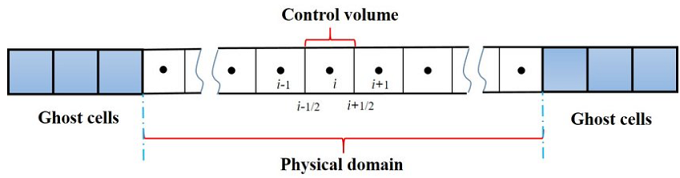

Physically, we assume as known the values at edges (i.e. $i\pm k\times 1/2$, $~k \in \mathbb{N}$). We then introduce the notatation of mean values $i\pm k$, $~k \in \mathbb{N}$. This consists into extrapolating the value in a cell from values at edges. We repeat the process for a given number of cells and this cell-package constitue the numerical mesh, while the process itself is called discretization.

It's what allows to go from a differential form to a codable one. Here is in detail the path from differential equation to numerical one :

The general formula for a quantity variation is given under global form as follows :

$$ \underbrace{\dfrac{\partial}{\partial t}\iiint_{\Omega} c ~ \,dV}_{\text{greatness variation}} = \underbrace{- \iint \underline{j}\cdot\underline{n} \,dS}_{\text{flux/exchange}} + \underbrace{\iiint_{\Omega} \phi ~ \,dV}_{\text{Production/absorbtion}} $$

Therefore, if considereing the above system, one sees it's of this form with $\phi \equiv S$, $\underline{j}\equiv\underline{F}$ and $c \equiv U$. For what is up to the flux, using Gauss's theorem :

$$ \iint \underline{j}\cdot\underline{n} \,dS \equiv \iint \underline{F}\cdot\underline{n} \,dS = \iiint div(F) \,dV $$

and eventually by identification (1D case) :

$$ \dfrac{\partial}{\partial t}\int_{\Omega} U ~ \,dx = - \int_{\Omega} \partial_x F \,dx + \int_{\Omega} S \,dx $$

It's at this stage that we'll do discretization. Considering the introduced mesh :


$U_i = \frac{1}{\Delta_x}\int_{x_{i-1/2}}^{x_{i+1/2}}U(x,t)$ $~~$ & $~~$ $\frac{1}{\Delta_x}\int_{x_{i-1/2}}^{x_{i+1/2}}\partial_x F(x,t) = \frac{F(x_{i+1/2}, t) - F(x_{i-1/2}, t)}{\Delta_x} \equiv \frac{F_{i+1/2} - F_{i-1/2}}{\Delta_x}$ $~~$ & $~~$ $S_i = \frac{1}{\Delta_x}\int_{x_{i-1/2}}^{x_{i+1/2}}S(x,t)$ \\

At this stage, let's clarify what we do on the flux specifically : we get mean flux in a cell by substraction of exiting to incoming flow. We more importantly assume once again that the flux can be directly evaluated at edges. This implies we now have an exact discretized mesh (no approximation made) if the flux is known at edges/nodes.

Finally for one cell : $$\dfrac{\partial U_i}{\partial t} = - \dfrac{F_{i+1/2} - F_{i-1/2}}{\Delta_x} + S_i$$


We now have to choose what method we use for time discretization. We in fact considered forward ($\equiv$ explicit) Euler method. This method is known to be potentially unstable depending on what mesh we consider (i.e. time and space steps $\Delta t$ & $\Delta x$). We will thus have to consider a smooth enough scheme to ensure stability while solving the system.

This method writes down as :

$\dfrac{\partial U_i}{\partial t} =  \dfrac{U_i^{n+1} - U_i^{n}}{\Delta_t} = - \dfrac{F_{i+1/2}^n - F_{i-1/2}^n}{\Delta_x} + S_i^n$

We conclude on a general form known as finite volume scheme :

$$ U_i^{n+1} = U_i^{n} - \Delta_t \dfrac{F_{i+1/2}^n - F_{i-1/2}^n}{\Delta_x} + \Delta_t S_i^n $$

This result is known as the finite volume scheme in conservation form. While most schemes usually work on different fluxES F(U), we will see one (MacCormack scheme) that useS a 2 step approach.

**$\Rightarrow$ We point out that the above process was made to describe the discretization process and hence make the link from physical to numerical approach.**



The numerical scheme we will consider and work on during this report is MacCormack scheme. It consists on a first step where we use the finite volume formula before applying a corrector step. It's this corrector step that brings the scheme's dispersivity. The scheme is known as MacCormack scheme and it writes down as :

a) Predictor step
$$ U_i^* = U_i^n - \frac{\Delta t}{\Delta x}(F_{i+1}^n - F_i^n) + \Delta_t S_i^n $$

b) Corrector step
$$ U_i^{n+1} = \frac{1}{2}(U_i^n + U_i^*) - \frac{\Delta t}{2\Delta x}(F_{i}^* - F_{i-1}^*) + \Delta_t S_i^*$$

This scheme as one could note is dispersive as it's based on a first approximation step that's then corrected. We thereby reduce in a second time the approximation but can't avoid it.

In the following, we will test this code for several physical considerations.

##### Libraries

In [ ]:
## Maths functions :
import numpy as np
import scipy.sparse as sp

## 2D representation :
import matplotlib.pyplot as plt

## 3D representation :
from mpl_toolkits import mplot3d
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm                 # color

from matplotlib.ticker import LinearLocator, FormatStrFormatter

## Animation :
import matplotlib.animation as animation
from IPython.display import HTML

%matplotlib inline

#### Mesh

In [ ]:
### Mesh

## Space
N = 100   # nb point
L = 10.   # length mesh

x   = np.linspace(0, L, N) # Spatial grid
dx  = L/len(x) # space step

## Time
t  = 0     # Initial time
tf = 10    # Final time
dt = 0.005 # Time step

# save time
stepte = 0.5    # times step
te     = stepte # initial time

g   = 10    # m.s-2
rho = 1000  # kg.m^3
mu  = 10**-3 #  Pa.s

## Initial conditions

In [ ]:
def eta_0(x):

    """  Slope initial condition - Smooth IC """

    return 1. + x*0.2

def eta_0_d(x): 

    """  Dam - Discontinuous IC """

    L = x[-1]

    return 1. + .5*(x<L/2.)

def eta_0_d2(x):

    """  Discontinuous initial condition v2 """

    L = x[-1]

    return 1. - 0.5*(x>5*L/8.) + 0.5*(x>3*L/8.)


## Flux and operators 

In [ ]:
# Matrix method

def diverg_up_op(m):

    """ divergence operator  """
    
    Div = sp.diags([-1,1], [0,1], (m,m)).toarray()
    Div[0,1] = 0
    Div[0,0] = Div[-1,-1] = 1
#    Div = 1./dx * Div

    return Div

def diverg_down_op(m):
  
    """ divergence operator  """
    
    Div = sp.diags([-1,1], [-1,0], (m,m)).toarray()
    Div[-1,-2] = 0
#    Div = 1./dx * Div

    return Div

## F(U) terms
def fill_F(U):
    
    """ Flux F(U) - see shallow water diff. system """

    F      = U.copy();
    F[:,0] = U[:,1]
    F[:,1] = U[:,1]*U[:,1]/U[:,0]+0.5*g*U[:,0]*U[:,0]
    
    return F

## Boundary conditions
def BC(U):

    """ BC - bouncing wave """

    U[0,0]  = U[1,0]
    U[-1,0] = U[-2,0]
    
    U[0,1]  = U[-1,1] = 0
    
    return

## Animation Function

In [ ]:
def plot_variation(Eta, f = 0):

  """ Function taking as parameters the total height list eta with topology f, or height list h only & then returns the anim variable for animation.
  
  To use the function :
  # height list Eta only
  anim = plot_variation(Q)
  HTML(anim.to_jshtml())

  # the total height list Eta with topology f
  anim = plot_variation(Eta, f)
  HTML(anim.to_jshtml()) """

  n = np.arange(0,np.shape(Eta)[0]) 

  fig = plt.figure(figsize=(8,4))      # Create an empty figure
  ax  = plt.axes()
  if np.any(f != 0):
      ax.plot(x, f, 'k', linewidth=3)
  line, = ax.plot([], [], linewidth=2)  # Create an empty line plot
  
  plt.xlabel('Space x')
  plt.ylabel('h(x,t)')

  plt.axis((0,10,0,4))                 # Set the bounds of the plot

  def plot_q(n):
      line.set_data(x, Eta[n])  # Replace the line plot with the solution at time t

  anim=animation.FuncAnimation(fig, plot_q, frames=n)  # Animate the solution
  return anim

In [ ]:
def compare_anim(Eta_1, Eta_2, f = 0, s1='line1', s2='line2'):
  
  """ Function taking as parameters 2 height lists eta1 and eta2 with options topology f, as well as 2 labels s1, s2  
  & returns the anim variable for animation """

  n = np.minimum(len(Eta_1),len(Eta_2)) 

  fig = plt.figure(figsize=(8,4))      # Create an empty figure
  ax  = plt.axes()
  if np.any(f != 0):
    ax.plot(x, f, 'k',linewidth=3)
  line1, = ax.plot([], [], linewidth=2, label = s1)  # Create an empty line plot
  line2, = ax.plot([], [], linewidth=2, label = s2)  # Create an empty line plot
  plt.axis((0,10,0,4))                              # Set the bounds of the plot
  plt.xlabel('Space x')
  plt.ylabel('h(x,t)')
  plt.legend()

  def plot_q_com(n):
    line1.set_data(x, Eta_1[n])
    line2.set_data(x, Eta_2[n])  # Replace the line plot with the solution at time t

  anim=animation.FuncAnimation(fig, plot_q_com, frames=n)  # Animate the solution
  
  return anim

## II. $\underline{\text{Shear stress :}}$

*Please note that we will in the following refer to **U** as the vector containing **h**, the height, and **q**, the flux. The variable **u** will then account for the waves' speed.*

### Friction


Porosity-based shallow water models have become increasingly popular in dealing with subgrid-scale geometric and topographic features in shallow water flows.
Typical applications include urban flood modelling and the modelling of shallow flows over complex topographies.
In computational fluid dynamics, the MacCormack method is a widely used discretization scheme for the numerical solution of hyperbolic partial differential equations.

In order for us to modelize the shearing term in the flow we must look at the form provided in shallow water equation :

$$ S = - \frac{\tau(f)}{\rho} $$

with $\tau(f) = \mu\frac{\partial Ux(y)}{\partial y}$

Therefore, several cases are possible :

- an approximation assuming low speed variation $\frac{\partial u_x(y)}{\partial y} \approx \frac{u}{h} = \frac{q}{h^2}$ and so $\boxed{\tau(f) = \mu\frac{q}{h^2}}$. This case assumes a speed of constant profil, which isn't in agreement with viscosity at the bottom.

- a linear speed profile : $u_x(y) = ay+b$, $~~~a,b \in \mathbb{R}$. We need 2 BC to get an expression for a and b. We then assume $u_x(y=f) = af+b=0$ and $q = \int_{f}^{\eta} u_x(y) ~dy$. \\
After calculation : $u_x(y) = \frac{2q(y-f)}{h^2}$. We thus have $\tau = \boxed{\tau(f) = \mu\frac{2q}{h^2}}$. \\
We have a factor 2 appearing compared to the approximation case. However, we know from a physical approach that the profile will rather be of quadratic form. For simplification's sake and as the number of BC one can consider here is limited to not restrain the flow too much, we will limit the speed profile to order 2. 

As a third case, we suppose the velocity profile is that of a Poiseuille flow, which means the velocity profile has the properties:
\begin{align*}
    U_x(y)& = a\cdot y^2 + b\cdot y + c \\
    U_x(y = f)& = 0 \quad \frac{\partial U_x}{\partial y} (y = \eta) = 0
\end{align*}

At a given point x, values $a$, $b$ and $c$ are 3 constant values. We can also put the equation under the form:
\begin{equation*}
    U_x(y) = a\cdot (y-f) \left[ (2\eta - f) - y \right]
\end{equation*}

As a consequence, the shear stress at the topology is :
\begin{equation*}
    \tau (f) = \mu \frac{\partial U_x}{\partial y} = - 2 \mu a (y - \eta) |_{y = f} = 2 \mu a h(x,t)
\end{equation*}

To express a, we use the relation:
\begin{equation*}
    q = \int_{f}^{\eta} U_x(y) = -a  \int_{f}^{\eta} (y-f) \left[y - (2\eta - f) \right] dy = \frac{2}{3} a h^3
\end{equation*}

Finally, we have the formula we will use thoughout this report :
\begin{equation*}
    \boxed{\tau (f) = 2 \mu \left( \frac{3}{2} \frac{q}{h^3} \right) h = \mu \frac{3q}{h^2}}
\end{equation*}

**$\Rightarrow$ With a much simple formula obtained, we can see that we reach a higher precision on the flow profile, while respecting the BCs for a viscous flow.**

In [ ]:
def fill_S(U):
    
    """ Function returning S - Production term """

    S      = U.copy();
    S[:,0] = 0
    S[:,1] = -mu/rho*3*U[:,1]/U[:,0]**2
    
    return S

## MacCormack with shear stress


In this section, we give a detailed description of the MacCormack algorighm for system . First, we recall that the MacCormack scheme , a two step explicit method which consists of  predictor and corrector step. The scheme uses the forward difference in the predictor step while the corrector step considers the backward difference.

#### $\underline{\text{System solving}}$

In [ ]:
## System solving

# Initialisation
u = np.zeros((N, 2))

# Height
u[:,0] = eta_0(x)
BC(u)

u0 = u[:,0]
h  = [u0.copy()]

dtdx = dt/dx

# Matrix method
Div_up   = diverg_up_op(N)
Div_down = diverg_down_op(N)

# Main code
while t < tf:
    
    # Predictor
    F = fill_F(u)
    S = fill_S(u)
    
    ustar = u - dtdx*Div_up.dot(F) + dt*S

    BC(ustar)
    
    # ------------------------------------------------------------

    # Corrector
    F = fill_F(ustar)
    S = fill_S(ustar)
    
    unew = 0.5 * (ustar + u) - .5*dtdx*Div_down.dot(F) + dt * S

    BC(unew)
    
    # ------------------------------------------------------------

    t = t + dt
    u = unew.copy()
    
    # Saving values
    if (t >= te):
        te = te + stepte
        h.append(unew[:,0].copy())
        

###Animation

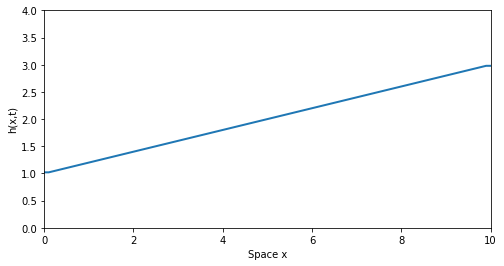

In [ ]:
A = plot_variation(h,0)
HTML(A.to_jshtml())

**$\Rightarrow$ $\underline{\text{Conclusion Shear stress}}$. In shallow water configuration as the value of h is small, we have a low shear stress cofficient. The shear stress can be coded easily, but it might present an  destructive (unstable) behavior when  h is close to zero (physically increasing $\tau$  for h decreasing is good but numerically it leads to runtime errors due to infinity value).**

## III. $\underline{Topology :}$

The **topology** can be seen as the bed surface elevation. It relates to the geometrical properties of the environment where the fluid flows.

As a recall, the **Shallow Water Equations** are:

\begin{align}
    \frac{\partial h}{\partial t} &+ \frac{\partial q}{\partial t} = 0\\
    \frac{\partial q}{\partial t} &+ \frac{\partial}{\partial t} \left( \frac{q^2}{h} \right) = - gh \frac{\partial \eta}{\partial x} - \frac{1}{\rho} \tau (f)
\end{align}

So when we add a topology, the term $f(x)$ (function of the bottom) is no longer 0, and then using the definition of the free surface : $\eta=h+f$, we have :

\begin{align}
\frac{\partial \eta}{\partial x} = \frac{\partial f}{\partial x} + \frac{\partial h}{\partial x}
\end{align}
So the second equation becomes:

\begin{align}
    \frac{\partial q}{\partial t} + \frac{\partial}{\partial t} \left( \frac{q^2}{h} + \frac{g h^2}{2}  \right) = - gh \frac{\partial f}{\partial x} - \frac{1}{\rho} \tau (f)
\end{align}

Re-writting the system of equation :

\begin{align}  
     \frac{\partial \textbf{U}}{\partial t} &+ \frac{\partial \textbf{F}(\textbf{U})}{\partial t} = \textbf{S}(\textbf{U})  
\end{align}  

  \begin{align}  
    \textbf{U} = 
    \begin{pmatrix}
    h\\
    q
    \end{pmatrix} &
    \quad
    \textbf{F}(\textbf{U}) = 
    \begin{pmatrix}
    q\\
    \frac{q^2}{h} + \frac{g h^2}{2}
    \end{pmatrix}
    \quad
    \textbf{S}(\textbf{U}) = 
    \begin{pmatrix}
    0\\
    - gh \frac{\partial f}{\partial x} - \mu \frac{3q}{h^2}
    \end{pmatrix}
\end{align}

we can see that the topology appears in the source term, but by its derivative. 

### Defining the floor

In [ ]:
def Bottom_f(x):

  """ Gaussian bump """

  return 0.4*np.exp(-(x-L/2)**2)

def derive_f(f, dx):

  """ Slope topology """

  # Initialisation
  df = np.zeros_like(f)

  df[1:] = (f[1:] - f[:-1])/dx  # leftwards difference
  df[0]  = df[1]

  return df

## Different bottoms

We define below a few bottoms one can then use to test out the well-doing of the code. Each of them has and will be tested as they all provide usefull informations on the fluid's behavior.

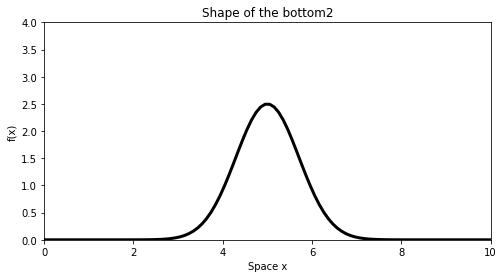

In [ ]:
def Bottom_f2(x):

  """ High Gaussian bump """

  return 2.5*np.exp(-(x-L/2)**2)

# Display
fig = plt.figure(figsize=(8,4))
ax  = plt.axes()

ax.plot(x, Bottom_f2(x), 'k',linewidth=3)

plt.xlabel('Space x')
plt.ylabel('f(x)')
plt.title('Shape of the bottom2')

plt.axis((0,10,0,4)) 

plt.show()

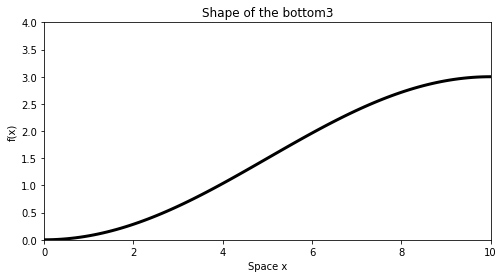

In [ ]:
def Bottom_f3(x):

  """ Topology of a right beach """

  return 1.5*(1 - np.cos(np.pi*x/L))

# Display
fig = plt.figure(figsize=(8,4))
ax  = plt.axes()

ax.plot(x, Bottom_f3(x), 'k',linewidth=3)

plt.xlabel('Space x')
plt.ylabel('f(x)')
plt.title('Shape of the bottom3')

plt.axis((0,10,0,4)) 

plt.show()

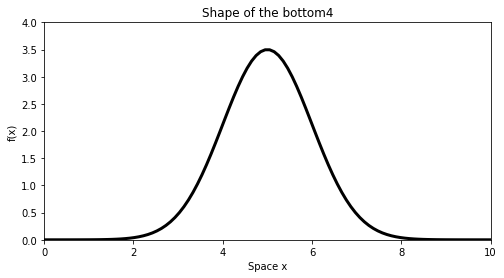

In [ ]:
def Bottom_f4(x):

  """ Very high Gaussian bump"""

  return 3.5*np.exp(-0.5*(x-L/2)**2)

# Display
fig = plt.figure(figsize=(8,4))
ax  = plt.axes()

ax.plot(x, Bottom_f4(x), 'k',linewidth=3)

plt.xlabel('Space x')
plt.ylabel('f(x)')
plt.title('Shape of the bottom4')

plt.axis((0,10,0,4)) 

plt.show()

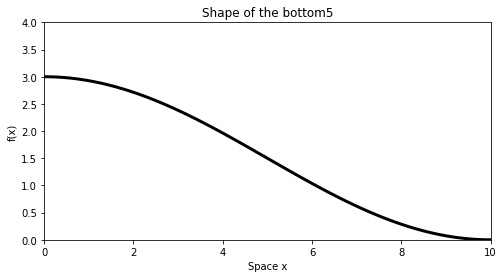

In [ ]:
def Bottom_f5(x):

  """ Topology of a left beach """
  
  return 1.5*(1 + np.cos(np.pi*x/L))

# Display
fig = plt.figure(figsize=(8,4))
ax  = plt.axes()

ax.plot(x, Bottom_f5(x), 'k',linewidth=3)

plt.xlabel('Space x')
plt.ylabel('f(x)')
plt.title('Shape of the bottom5')

plt.axis((0,10,0,4)) 

plt.show()

The above topology is made to show the well performance of the code with fluid to the right as well as to the left.

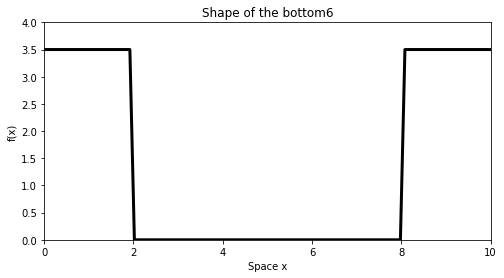

In [ ]:
def Bottom_f6(x):

  """ Topology of a swimming-pool/Bassin, used to show the dynamic boundary conditions """

  return 3.5*((x>8)|(x<2))

# Display
fig = plt.figure(figsize=(8,4))
ax  = plt.axes()

ax.plot(x, Bottom_f6(x), 'k',linewidth=3)

plt.xlabel('Space x')
plt.ylabel('f(x)')
plt.title('Shape of the bottom6')

plt.axis((0,10,0,4)) 

plt.show()

## New S vector

We have to define a new **Source term** vector :
\begin{align}
\textbf{S}(\textbf{U}) = 
    \begin{pmatrix}
    0\\
    - gh \frac{\partial f}{\partial x} - \mu \frac{3q}{h^2}
    \end{pmatrix}
\end{align}

In [ ]:
def fill_S2(U, df):

    """ Function returning S - Production term - Topology + Shear stress """

    S      = U.copy();
    S[:,0] = 0
    S[:,1] = -g*df*U[:,0] - mu/rho*3*U[:,1]/U[:,0]**2
    
    return S

## MacCormack with topology

In [ ]:
## Algo
def MacCormack_Topology(f, h0, t, dt, tf, stepte):
    
    """ Function to solve diff. system - returns eta function """
    
    df   = derive_f(f, dx)
    dtdx = dt/dx

    u    = np.zeros((N, 2))

    u[:,0] = h0
    Eta    = [(h0.copy()+f)]
    BC(u)

    # Saving variable
    te     = stepte

    # Matrix method
    Div_up   = diverg_up_op(N)
    Div_down = diverg_down_op(N)

    # Main code
    while (t < tf):

        # Predictor
        F = fill_F(u)
        S = fill_S2(u, df)

        ustar = u - dtdx*Div_up.dot(F) + dt*S

        BC(ustar)
        
        # ---------------------------------------------------------
        
        # Corrector
        F = fill_F(ustar)
        S = fill_S2(ustar, df)

        unew = 0.5 * (ustar + u) - .5*dtdx*Div_down.dot(F) + dt*S

        BC(unew)

        # ---------------------------------------------------------

        t = t + dt
        u = unew.copy()

        # Saving data
        if (t >= te):
            te = te + stepte
            Eta.append((unew[:,0].copy()+f)) 

    return Eta

###Animation

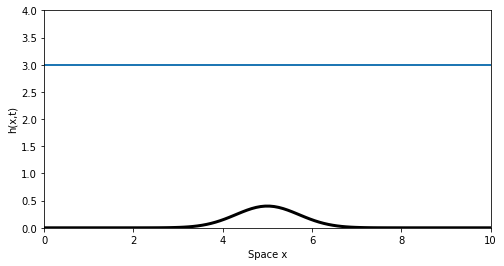

In [ ]:
f  = Bottom_f(x)
h0 = 3. - f #eta_0(x) - f
Eta  = MacCormack_Topology(f, h0, t=0, dt = 0.005, tf=10, stepte=0.5)
anim = plot_variation(Eta, f)
HTML(anim.to_jshtml())

**$\Rightarrow$ $\underline{\text{Conclusion Topology}}$. The topology brought two main informations :**

$\hspace{1cm}$ **- as the flow moves with a non-constant bottom, it may reach points where there is zero height and so where some terms of the numerical system becomes destructive.** \\

$\hspace{1cm}$ **- Normally with the topology ,the flow represents a rest lake. However as we can see above there is an  unphysical behavior makes  that makes that the fluid is in movement, even when it shouldn't (constant $\eta$ and zero flux q).** \\

We will first correct this unphysical behavior before heading towards dry state limit case.

## $\underline{\text{Rest Lake :}}$

Without water floor ($f = 0$), if we define initial conditions as $h = \text{cst}$ and $q = 0$, no movement is observed, and so the lake is always at rest. However, after adding the topology, with initial conditions $\eta = \text{cst}$ and $q = 0$, waves appear in the computational result, which is not physically correct. Moreover, repeating the calculation for a rest lake wastes time and computer resources. To fix  this problem, we thereby add a function to determine if the lake is at rest or not.

Basically, there are 2 things to verify : (1) That there is no flux at any position (2) That the total height $\eta$ is constant. We must also consider the case where part of the water floor is higher than the total height and is exposed to air. In this case, locally, $\eta = f$ and $h=0$. Thereby, the function is defined as following : 

In [ ]:
def is_rest_lake(f, U):
    
    """ Function that takes as parameters the buttom shape and the U vector with U[:,0], the height of the water and U[:,1] the flux.
    It Returns the Boolean positions where the lake is at 'rest' """

    eta0      = U[0,0] + f[0]
    condition = ((np.abs(U[:,0] + f - eta0)<0.001)|((f > eta0)&(U[:,0] == 0))) & (U[:,1] == 0)
    
    return np.all(condition)

In [ ]:
## Algo
def MacCormack_Rest(f, h0, t, dt, tf, stepte):

    """ Function to solve diff. system - returns eta function - takes into consideration zero height (dry state) """

    df = derive_f(f, dx)

    u = np.zeros( (N, 2) )

    u[:,0] = h0
    BC(u)

    Eta = [(h0.copy()+f)]

    te = stepte

    dtdx = dt/dx
    Div_up = diverg_up_op(N)
    Div_down = diverg_down_op(N)

    # Main code
    while (t < tf) and (not is_rest_lake(f, u)):

        # Predictor
        F = fill_F(u)
        S = fill_S2(u, df)

        ustar = u - dtdx*Div_up.dot(F) + dt*S

        BC(ustar)

        # ---------------------------------------------------------------

        # Corrector
        F = fill_F(ustar)
        S = fill_S2(ustar, df)

        unew = 0.5 * (ustar + u) - 0.5*dtdx*Div_down.dot(F) + dt*S

        BC(unew)

        # ---------------------------------------------------------------

        t = t + dt
        u = unew.copy()

        # Saving values
        if (t >= te):
            te = te + stepte
            Eta.append((unew[:,0].copy()+f))

    return Eta

### Animation

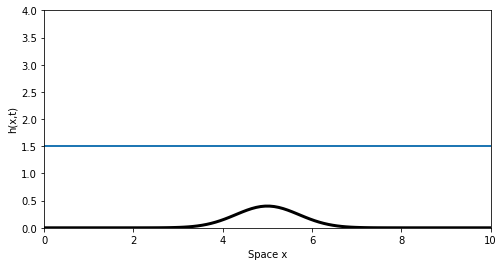

In [ ]:
f  = Bottom_f(x)
h0 = 1.5 - f

Eta  = MacCormack_Rest(f, h0, t=0, dt = 0.005, tf=10, stepte=0.5)
anim = plot_variation(Eta, f)
HTML(anim.to_jshtml())

**$\Rightarrow$ $\underline{\text{Conclusion Rest lake}}$ One can now see the water is at rest and that the fluid is no more in movement for related physical cases.**

We can now head towards dry state limit case.

## $\underline{\text{Dry state :}}$

When we model the dry state, which means $h=0$, terms having $h$ at denominators in $\textbf{S}(\textbf{U})$ and $\textbf{F}(\textbf{U})$ vectors tend to infinity, and it's not acceptable both for calculation and physical meaning. To solve this issue, we calculate only on parts where $h \neq 0$. Yet, for coding sake the threshold will rather be defined as $h_{lim}=eps$, with $eps$ a given acceptable height limit fixed by user. The implementation of this method give the following $\textbf{S}$ and $\textbf{F}$ functions

New F and S functions : 

In [ ]:
def fill_F3(U, eps):

    """ Function to fill flux vector - takes into consideration zero height """

    # indices where the flow isn't at eps or below
    posi_not_dry = (U[:,0] > eps)
    
    # We only calculate values at these indices while the rest (where h<=eps) remains at zero
    F = np.zeros_like(U)
    F[posi_not_dry,0] = U[posi_not_dry,1]
    F[posi_not_dry,1] = U[posi_not_dry,1]**2/U[posi_not_dry,0]+0.5*g*U[posi_not_dry,0]*U[posi_not_dry,0]
    
    return F

def fill_S3(U, df, eps):

    """ Function returning S - Production term - Topology + Shear stress + Dry state """
  
    # indices where the flow isn't at eps or below
    posi_not_dry = (U[:,0] > eps)
    
    S = np.zeros_like(U)
    S[posi_not_dry,1] = -g*df[posi_not_dry]*U[posi_not_dry,0] - mu/rho*3*U[posi_not_dry,1]/U[posi_not_dry,0]**2
    
    return S

In [ ]:
def MacCormack_Dry(f, h0, t, dt, tf, stepte):

    """ Function returning Eta - diff. system solver - dry state """

    # derivative
    df = derive_f(f, dx)

    # term limit dry case
    eps = 0.08

    # u vector
    u    = np.zeros((N, 2))
    posi = h0>0 
    u[posi,0] = h0[posi]

    BC(u)
    
    u0  = u[:,0]
    Eta = [(u0.copy()+f)]

    # ---------------------------------------------------------------

    te = stepte

    dtdx = dt/dx

    # Matrix method
    Div_up = diverg_up_op(N)
    Div_down = diverg_down_op(N)

    # Main code
    while (t < tf) and (not is_rest_lake(f, u)): # Condition over rest lake

        # Predictor
        F = fill_F3(u, eps)
        S = fill_S3(u, df, eps)

        ustar = u - dtdx*Div_up.dot(F) + dt*S
        BC(ustar)   

        # ---------------------------------------------------------------

        # Corrector
        F = fill_F3(ustar, eps)
        S = fill_S3(ustar, df, eps)

        unew = .5 * (ustar + u) - .5*dtdx*Div_down.dot(F) + dt*S
        BC(unew)

        # ---------------------------------------------------------------

        t = t + dt
        u = unew.copy()

        # Saving values
        if (t >= te):
            te = te + stepte
            Eta.append((unew[:,0].copy()+f))

    return Eta

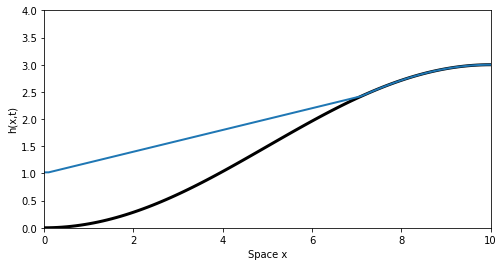

In [ ]:
## Display Eta function

# Initial parameters
f = Bottom_f3(x)
h0 = eta_0(x) - f

# Solution
Eta = MacCormack_Dry(f, h0, t=0, dt = 0.005, tf=5., stepte=0.05)

# Display
anim = plot_variation(Eta, f)
HTML(anim.to_jshtml())

Now we test the function on a water floor that resembles to a hill in water. We observe that $h$ diverges from the water boundary near the hill. 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:11: RuntimeWarning: overflow encountered in square
  # This is added back by InteractiveShellApp.init_path()
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:11: RuntimeWarning: overflow encountered in multiply
  # This is added back by InteractiveShellApp.init_path()
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:23: RuntimeWarning: overflow encountered in square
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:23: RuntimeWarning: invalid value encountered in true_divide


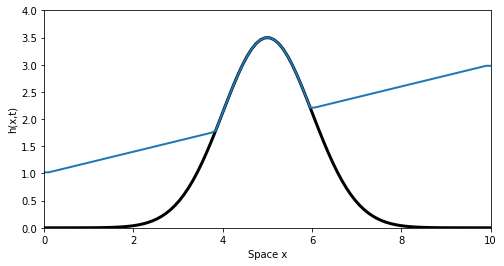

In [ ]:
## Display Eta function

# Initial parameters
f = Bottom_f4(x)
h0 = eta_0(x) - f

# Solution
Eta = MacCormack_Dry(f, h0, t=0., dt = 0.005, tf=2., stepte=0.05)

# Display
anim = plot_variation(Eta, f)
HTML(anim.to_jshtml())

**$\Rightarrow$ $\underline{\text{Conclusion Dry state 1}}$. The dry-state with MacCormack presents a stable behavior. However, this has limit. Indeed, the behavior is stable for a limited time only. After running several time the study in the above bottoms, we went to the conclusion that the destructive behavior is occuring first at dry-state position. The issue then is that the BC one apply to the left and right edges are not sufficient anymore. In the following part, we will buil a code accounting for dynamic BC, especially in the case of emerging bottom.**

## Dry state with dynamic boundary conditions 

To solve this problem, we try to add boundary conditions on water boundaries due to water floor geometry. Because the positions of these boundary vary from time to time, depending on mouvement of water, we call them 'dynamic boundaries'.

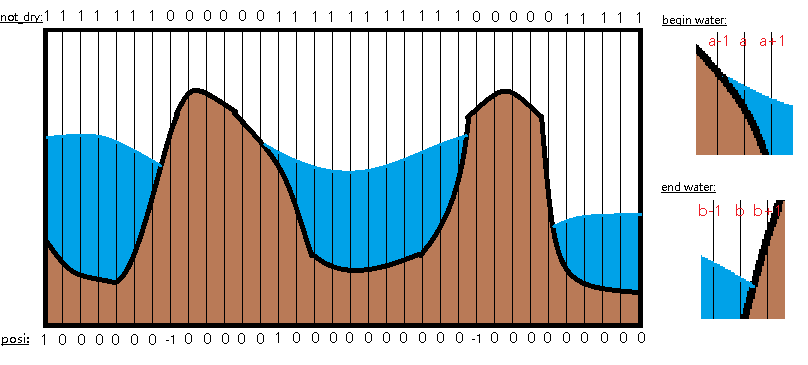

To apply the dynamic boundary conditions, we define a new boundary condition function. After verifying that we need to apply dynamic boundary conditions, which means to test if there are dry parts, firstly we should identify the positions of boundaries. To do this, we use a vector *not_dry* to distinguish parts covered by water (marked as 1) and dry parts (marked as 0). Then we calculate the *posi* vector by subtracting the each element in *not_dry* by its precedent position value. In *posi* vector, positions which have value 1 mean the beginning of water (the first position where there is water), positions which have value -1 means the end of water (the first position where there is no water). An example is illustrated by above figure.

After extracting these positions in 2 vectors (*begin\_water* and *end\_water*), we subtract 1 from index positions of end water to have the last position where there is water. Mark the first position where there is water as $a$ and the last position where there is water as $b$.

Inspired by the boundary conditions of walls on the left and right sides, we define the dynamic boundary condition **due to water floor geometry** as follows : 
\begin{align*}
    &\text{Condition on water height:}\\
    \frac{\partial \eta_a}{\partial x} &= 0 \quad  \frac{\partial \eta_a}{\partial x} \approx \frac{\eta_{a+1} - \eta_{a-1}}{2 d x}
    \longrightarrow \eta_{a-1} = \eta_{a+1} \longrightarrow h_{a-1} = h_{a+1} + f_{a+1} - f_{a-1}\\
    \frac{\partial \eta_b}{\partial x} &= 0 \quad  \frac{\partial \eta_b}{\partial x} \approx \frac{\eta_{b+1} - \eta_{b-1}}{2 d x}
    \longrightarrow \eta_{b+1} = \eta_{b-1} \longrightarrow h_{b+1} = h_{b-1} + f_{b-1} - f_{b+1}\\
    
    &\text{Condition on flux:} \quad q_a = 0 \quad q_b = 0
\end{align*}


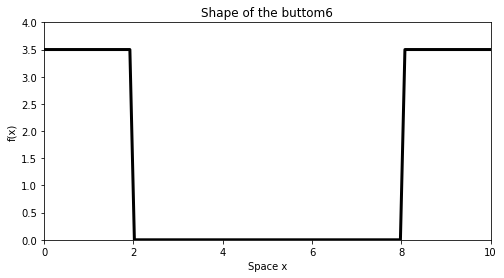

In [ ]:
## Display Eta0 function

fig = plt.figure(figsize=(8,4))      # Create an empty figure
ax  = plt.axes()

ax.plot(x, Bottom_f6(x), 'k',linewidth=3)

plt.xlabel('Space x')
plt.ylabel('f(x)')
plt.title('Shape of the buttom6')

plt.axis((0,10,0,4)) 

plt.show()

However, if the boundary is very sharp, as in above example of a swimming pool topology, values of $h_{a-1}$ and $h_{b+1}$ can be negative, which is not physically acceptable. If it's the case, we impose value on $h_{a-1}$ and/or $h_{b+1}$ as zero, and use the boundary conditions:
\begin{align*}
    &\text{Condition on water height:}\\
    \frac{\partial \eta_a}{\partial x}& \approx \frac{\eta_{a+1} - \eta_{a}}{ d x}
    \longrightarrow \eta_{a} = \eta_{a+1} \longrightarrow h_{a} = h_{a+1} + f_{a+1} - f_{a}\\
    \frac{\partial \eta_b}{\partial x} & \approx \frac{\eta_{b} - \eta_{b-1}}{ d x}
    \longrightarrow \eta_{b} = \eta_{b-1} \longrightarrow h_{b} = h_{b-1} + f_{b-1} - f_{b}\\
    &\text{Condition on flux:} \quad q_a = 0 \quad q_b = 0
\end{align*}

In [ ]:
def BC_new(U, f):
    
    """ Function returning U in case of dynamic BC - used especially in dry state """

    # Simple case where there is no dry parts
    U[0,0]  = U[1,0]
    U[-1,0] = U[-2,0]
    U[0,1]  = U[-1,1] = 0

    # if there are dry parts
    if np.any(U[:,0] <= 0): 

        # where we have a positive height
        not_dry = (np.abs(U[:,0]) > 0.01).astype(int)

        # rescaling
        posi     = not_dry.copy()
        posi[1:] = not_dry[1:] - not_dry[:-1]

        # Parameters to delimit where there is water
        begin_water = np.argwhere(posi == 1)
        end_water   = np.argwhere(posi == -1)
        end_water   = end_water - 1
        
        for i in range(np.minimum(begin_water.shape[0], end_water.shape[0])):
            
            a = begin_water[i,0]
            b = end_water[i,0]
            
            if a != 0:
                U[a-1,0] = np.maximum(U[a+1,0] + f[a+1] - f[a-1], 0.) # parallelipedic approximation ??
                #U[a-1,1] = 0
                U[a,1] = 0

                if U[a-1,0] == 0.:
                    U[a,0] = np.maximum(U[a+1,0] +f[a+1] - f[a], 0.) # parallelipedic approximation ??
                    U[a,1] = 0

            U[b+1,0] = np.maximum(U[b-1,0] + f[b-1] - f[b+1], 0.) # parallelipedic approximation ??

            # ----------------------------------------------------------------------

            if U[b+1,0] == 0.:
                U[b,0] = np.maximum(U[b-1,0] +f[b-1] - f[b],0)
                U[b,1] = 0

            U[b+1,1] = 0
            
        # ----------------------------------------------------------------------

        if (begin_water.shape[0] > end_water.shape[0]): 
            a = begin_water[-1,0]

            if a != 0:
                U[a-1,0] = np.maximum(U[a+1,0] + f[a+1] - f[a-1], 0.) # parallelipedic approximation ??
                U[a-1,1] = 0

                if U[a-1,0] == 0. and a != U.shape[0]-1:
                    U[a,0] = np.maximum(U[a+1,0] + f[a+1] - f[a], 0.) # parallelipedic approximation ??

            U[a,1] = 0
    return

## New MacCormack function

In [ ]:
def MacCormack_Dry2(f, h0, t, dt, tf, stepte):

    """ Function returning Eta - diff. system solver - dynamic BC + dry state """

    # derivative
    df = derive_f(f, dx)
    dtdx   = dt/dx

    # term limit dry case
    eps = 0.08

    # u vector
    u    = np.zeros((N, 2))
    posi = h0>0 
    u[posi,0] = h0[posi]

    BC_new(u,f)
    
    u0  = u[:,0]
    Eta = [(u0.copy()+f)]

    # ---------------------------------------------------------------
    
    te = stepte

    # Matrix method
    Div_up = diverg_up_op(N)
    Div_down = diverg_down_op(N)

    # Main code
    while (t < tf) and (not is_rest_lake(f, u)): # cd° over rest lake

        # Predictor
        F = fill_F3(u, eps)
        S = fill_S3(u, df, eps)

        ustar = u - dtdx*Div_up.dot(F) + dt*S

        BC_new(ustar,f)

        # ---------------------------------------------------------------

        # Corrector
        F = fill_F3(ustar, eps)
        S = fill_S3(ustar, df, eps)

        unew = .5 * (ustar + u) - .5*dtdx*Div_down.dot(F) + dt*S

        BC_new(unew,f)

        # ---------------------------------------------------------------

        t = t + dt
        u = unew.copy()

        # Saving values
        if (t >= te):
            te = te + stepte
            Eta.append((unew[:,0].copy()+f))

    return Eta

Examples of the new method

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:11: RuntimeWarning: overflow encountered in square
  # This is added back by InteractiveShellApp.init_path()
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:11: RuntimeWarning: overflow encountered in multiply
  # This is added back by InteractiveShellApp.init_path()
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:23: RuntimeWarning: overflow encountered in square
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:23: RuntimeWarning: invalid value encountered in true_divide


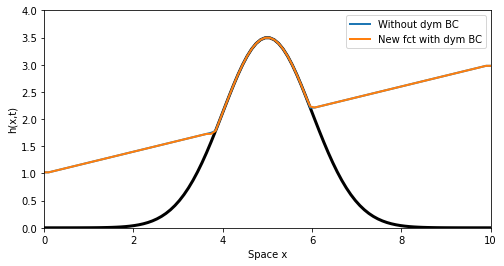

In [ ]:
## Display Eta function

# Initial parameters
f  = Bottom_f4(x)
h0 = eta_0(x) - f

# Solution
# We limit time as MacCormack gets destructive rapidly
Eta1 = MacCormack_Dry(f, h0, t=0, dt = 0.005, tf=2., stepte=0.05)
Eta2 = MacCormack_Dry2(f, h0, t=0, dt = 0.005, tf=2., stepte=0.05)

# Display
anim=anim=compare_anim(Eta1, Eta2, f, 'Without dym BC', 'New fct with dym BC')
HTML(anim.to_jshtml())

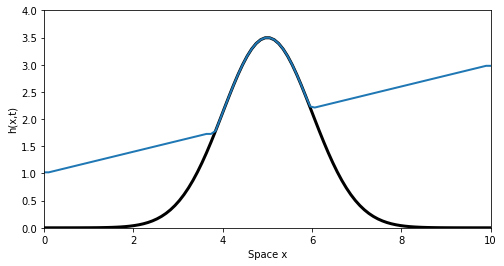

In [ ]:
## Display Eta function

# Initial parameters
f = Bottom_f4(x)
h0 = eta_0(x) - f

# Solution
Eta = MacCormack_Dry2(f, h0, t=0, dt = 0.005, tf=30, stepte=1.5)

# Display
anim = plot_variation(Eta, f)
HTML(anim.to_jshtml())

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:11: RuntimeWarning: overflow encountered in square
  # This is added back by InteractiveShellApp.init_path()
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:11: RuntimeWarning: overflow encountered in multiply
  # This is added back by InteractiveShellApp.init_path()
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:23: RuntimeWarning: overflow encountered in square
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:23: RuntimeWarning: invalid value encountered in true_divide


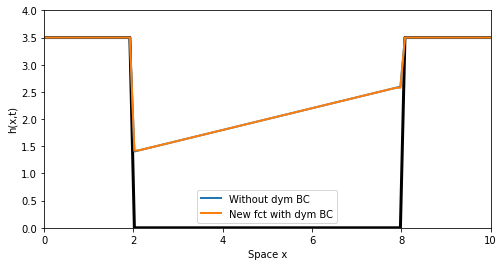

In [ ]:
## Display Eta function

# Initial parameters
f  = Bottom_f6(x)
h0 = eta_0(x) - f

# Solution
# We limit time as MacCormack gets destructive rapidly
Eta1 = MacCormack_Dry(f, h0, t=0, dt = 0.005, tf=0.25, stepte=0.02)
Eta2 = MacCormack_Dry2(f, h0, t=0, dt = 0.005, tf=0.25, stepte=0.02)

# Display
anim=anim=compare_anim(Eta1, Eta2, f, 'Without dym BC', 'New fct with dym BC')
HTML(anim.to_jshtml())

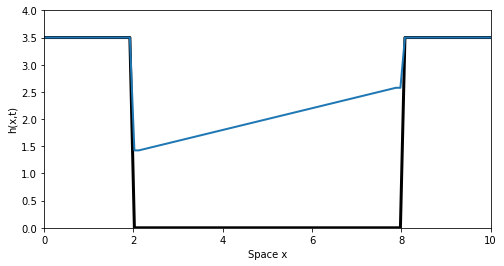

In [ ]:
## Display Eta function

# Initial parameters
f = Bottom_f6(x)
h0 = eta_0(x) - f
#h0 = -(x-6)*0.4 - f
#h0 = 2*(x<5)#+0.5

# Solution
Eta = MacCormack_Dry2(f, h0, t=0, dt = 0.005, tf=10, stepte=0.5)

# Display
anim = plot_variation(Eta, f)
HTML(anim.to_jshtml())

**Remark:**

When used for dry parts due to discontinuous initial condition like a dam failure, this method create certain quantity of water for the reason that there is a great difference between $h_{a-1}$ and $h_{a+1}$ ($h_{b+1}$ and $h_{b-1}$). By applying $h_{a-1} = h_{a+1} + f_{a+1} - f_{a-1}$ and $h_{b+1} = h_{b-1} + f_{b-1} - f_{b+1}$, $h_{a-1}$ and $h_{b+1}$ are greater than real situation.

(This can be observed when this method and HLL method are compared)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:11: RuntimeWarning: overflow encountered in square
  # This is added back by InteractiveShellApp.init_path()


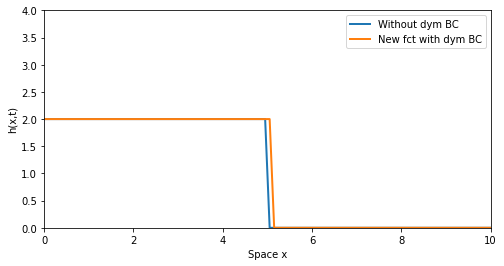

In [ ]:
## Display Eta function

# Initial parameters
f = np.zeros_like(x)
h0 = 2*(x<5)+0.0

# Solution
Eta1 = MacCormack_Dry(f, h0, t=0, dt = 0.005, tf=30, stepte=1.5)
Eta2 = MacCormack_Dry2(f, h0, t=0, dt = 0.005, tf=30, stepte=1.5)

# Display
anim=anim=compare_anim(Eta1, Eta2,f, 'Without dym BC','New fct with dym BC')
HTML(anim.to_jshtml())

The example above show that the new function create about half of the material, and that the first method fails due to lack of boundary condition. Therefore, while this new set of BC restores the well doing of the code, it brings as well some unphysical behavior (creation of matter).

## Riemann solvers - HLL 

The HLL solver is caracterized by a flux $F(U)$ defined from the flow's velocities. In fact, these vellocities are the eigen values of the Jacobian matrix : \\
$$M = \frac{\partial F(U)}{\partial U} = \begin{pmatrix}
0 & 1 \\
gh - \frac{q^2}{h^2} & \frac{2q}{h} 
\end{pmatrix}$$

$$\Rightarrow det(M) = 0 \Leftrightarrow \frac{q^2}{h^2} - gh = (\frac{q}{h} + \sqrt{gh})(\frac{q}{h} - \sqrt{gh}) = 0$$

We thereby have 2 eigenvalues : $S_L = \frac{q}{h} - \sqrt{gh}$ and $S_R = \frac{q}{h} + \sqrt{gh}$

Together with these two speeds, we introduce left and right terms in the sense terms at position $i+1$ (right) and $i-1$ (left). 

In the end, the HLL solver is defined by the following flux :

\begin{align*}
    F^{hll}_{num} &= 
    \left\{
        \begin{matrix}
        F_L & \text{if } 0 \leqslant S_L\\
        \frac{S_R F_L - S_L F_R +S_L S_R(U_R - U_L)}{S_R - S_L} &\text{if } S_L \leqslant 0 \leqslant S_R\\
        F_R & \text{if } 0 \geqslant S_R
        \end{matrix}
    \right.
\end{align*}

We now will code this flux and see what results it brings, especially with respect to basic MacCormack scheme.

In [ ]:
def F_HLL2(F, U, eps):

    """ Function returning flux vector - HLL case (work on speed) - takes into account dry state """

    posi_not_dry = (np.abs(U[:,0]) > eps)
    
    F_hll = np.zeros_like(F)
    
    SL = np.zeros(U.shape)
    SR = np.zeros(U.shape)
    
    SL[posi_not_dry,0] = SL[posi_not_dry,1] = U[posi_not_dry,1]/U[posi_not_dry,0] - np.sqrt(g*U[posi_not_dry,0]) # q/h - sqrt(gh)
    SL[:-1,:] = np.minimum(SL[:-1,:],SL[1:,:]) # SL(UL)
    SR[posi_not_dry,0] = SR[posi_not_dry,1] = U[posi_not_dry,1]/U[posi_not_dry,0] + np.sqrt(g*U[posi_not_dry,0]) # q/h + sqrt(gh)
    SR[:-1,:] = np.maximum(SR[:-1,:],SR[1:,:]) # SR(UR)
    
    FL = F.copy()
    FR = F.copy()
    FR[:-1,:] = F[1:,:]
    
    UR = U.copy()
    UR[:-1,:] = U[1:,:]
    
    F_hll[SL >= 0] = FL[SL >= 0]
    F_hll[SR <= 0] = FR[SR <= 0]
    F_hll[(SR > 0) & (SL <0)] = ((SR*FL - SL*FR + SL*SR*(UR - U))[(SR > 0) & (SL <0)])/(SR -SL)[(SR > 0) & (SL <0)] 
    
    return F_hll

Different from MacCormack method, we use the following discretization of the differential equation system:

$$ U_i^{n+1} = U_i^{n} -  \dfrac{\Delta_t}{\Delta_x}(F_{i+1/2}^n - F_{i-1/2}^n) + \Delta_t S_i^n $$

Where $F$ is the numerical flux of hll method.

In [ ]:
def HLL_Solver(f, h0, t, dt, tf, stepte):

    """ Function returning Eta - diff. system solver - HLL case """

    # derivative
    df = derive_f(f, dx)
    dtdx   = dt/dx

    # term limit dry case
    eps = 0.08

    # u vector
    u    = np.zeros((N, 2))
    posi = h0>0 
    u[posi,0] = h0[posi]

    BC(u)
    
    u0  = u[:,0]
    Eta = [(u0.copy()+f)]

    # Mass conservation
    #mass = np.zeros((int(tf/dt)))
    i    = 0  # index mass

    # ---------------------------------------------------------------

    te = stepte

    # while loop
    npas = int(tf/dt)
    k      = 0
    
    while k < npas and (not is_rest_lake(f, u)):

        k += 1

        BC(u)
        F = fill_F3(u, eps)
        F_hll = F_HLL2(F, u, eps)
        S = fill_S3(u, df, eps)

        unew = u.copy()
        unew[1:,:] = u[1:,:] - dtdx * (F_hll[1:,:] - F_hll[:-1,:]) + dt * S[1:,:]
        (unew[:,0])[unew[:,0] < 0 ] = 0

        # ---------------------------------------------------------------

        t = t + dt
        u = unew.copy()

        if (t >= te):
            te = te + stepte
            Eta.append((unew[:,0].copy()+f))

        # Mass conservation
        mass[i] = np.sum(unew[:,0].copy()+f)/len(unew[:,0].copy()+f)
        i += 1

    return Eta, mass

### Animation

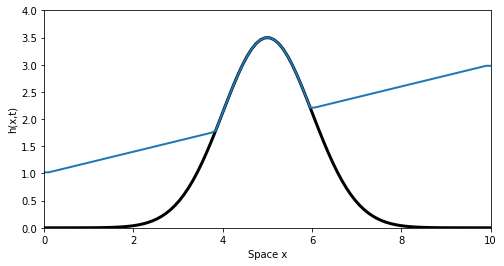

In [ ]:
## Display Eta function

# Initial parameters
f = Bottom_f4(x)
#h0 = 1.5 - f
h0 = eta_0(x) - f

# Solution
Eta, mass = HLL_Solver(f, h0, t=0, dt = 0.005, tf=10, stepte=0.5)

# Display
anim = plot_variation(Eta, f)
HTML(anim.to_jshtml())

Text(0, 0.5, 'mean height')

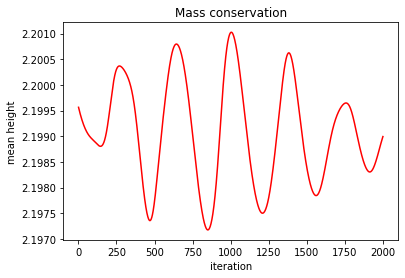

In [ ]:
# Mass conservation verification

npas = int(tf/dt)
time = np.linspace(1, npas, npas)

# -----------------------------

plt.figure()

plt.plot(time, mass, 'r-', )

plt.title('Mass conservation')
plt.xlabel('iteration')
plt.ylabel('mean height')

**$\Rightarrow$ As one can see and as mentioned during the building of the finite volume scheme, the solution is exact for known fluxes at edges ($i\pm1/2$).**

## Riemann solver - Rusanov

In [ ]:
def F_RUS(F, U, eps):
    
    """  Fill Flux vector of equations """
    
    # Size
    size_U_row = np.size(U,0)

    # -------------------------------

    ## Initialisation
    
    # fluxes
    F_RUS = np.zeros_like(F)    
    F_L   = np.zeros_like(F)
    F_R   = np.zeros_like(F)
    
    # velocities
    S      = np.zeros((size_U_row))
    S_L_UL = np.zeros((size_U_row))   
    S_L_UR = np.zeros((size_U_row))
    S_R_UL = np.zeros((size_U_row))
    S_R_UR = np.zeros((size_U_row))
    
    # u = [h; q]
    U_L = np.zeros_like(U)
    U_R = np.zeros_like(U)

    # -------------------------------
    
    idx = np.where(U[:,0]>eps)[0]
    
    ## 1st --------------------------
    
    # U = [h; q]
    #U_L[1:-1,:] = U[:-2,:]
    #U_R[1:-1,:] = U[2:,:]
    
    # fluxes
    
    #F_L[1:-1,:] = F[:-2,:]
    #F_R[1:-1,:] = F[2:,:]
    
    # u = [h; q]
    U_L = U.copy()
    U_R = U.copy()
    U_R[:-1,:] = U[1:,:]
    
    # fluxes
    F_L = F.copy()   
    F_R = F.copy()
    F_R[:-1,:] = F[1:,:]
    
    # velocities
    S_L_UL[:-1] = U_L[:-1,1]/U_L[:-1,0] - np.sqrt(g*U_L[:-1,0])
    S_L_UR[:-1] = U_R[:-1,1]/U_R[:-1,0] - np.sqrt(g*U_R[:-1,0])
    S_R_UL[:-1] = U_L[:-1,1]/U_L[:-1,0] + np.sqrt(g*U_L[:-1,0])
    S_R_UR[:-1] = U_R[:-1,1]/U_R[:-1,0] + np.sqrt(g*U_R[:-1,0])
        
    # 2nd -----------------------
    
    idx = np.where(U[:,0]>eps)[0]
    
    size_S = np.size(S_L_UL, 0)
    for k in range(1,size_S-1):
        S[k] = max(S_L_UL[k], S_L_UR[k], S_R_UL[k], S_R_UR[k])
        F[k, :] = .5*(F_L[k, :] + F_R[k, :]) - .5*S[k]*(U_R[k, :] - U_L[k, :])
    
    return F

In [ ]:
def F_RUS2(F, U, eps):
    
    """  Fill Flux vector of equations """
    
    posi_not_dry = (U[:,0] > eps)

    # Size
    size_U_row = np.size(U,0)

    # -------------------------------

    ## Initialisation
    
    # fluxes
    F_RUS = np.zeros_like(F)    
    F_L   = np.zeros_like(F)
    F_R   = np.zeros_like(F)
    
    # velocities
    S      = np.zeros_like(U)
    S_L_UL = np.zeros((size_U_row))
    S_L_UR = np.zeros((size_U_row))
    S_R_UL = np.zeros((size_U_row))
    S_R_UR = np.zeros((size_U_row))
    
    # u = [h; q]
    U_L = np.zeros_like(U)
    U_R = np.zeros_like(U)

    # -------------------------------
    
    ## 1st --------------------------
    
    # u = [h; q]
    U_L = U.copy()
    U_R = U.copy()
    U_R[:-1,:] = U[1:,:]
    
    # fluxes
    F_L = F.copy()   
    F_R = F.copy()
    F_R[:-1,:] = F[1:,:]
    
    # velocities
    #SL[posi_not_dry,0] = SL[posi_not_dry,1] = U[posi_not_dry,1]/U[posi_not_dry,0] - np.sqrt(g*U[posi_not_dry,0]) # q/h - sqrt(gh)
    #SL[:-1,:] = np.minimum(SL[:-1,:],SL[1:,:]) # SL(UL)
    
    S_L_UL[posi_not_dry] = U_L[posi_not_dry,1]/U_L[posi_not_dry,0] - np.sqrt(g*U_L[posi_not_dry,0])
    S_L_UL[:-1] = np.minimum(S_L_UL[:-1],S_L_UL[1:]) # SL(UL)
    S_L_UR[posi_not_dry] = U_R[posi_not_dry,1]/U_R[posi_not_dry,0] - np.sqrt(g*U_R[posi_not_dry,0])
    S_L_UR[:-1] = np.minimum(S_L_UR[:-1],S_L_UR[1:]) # SL(UL)
    S_R_UL[posi_not_dry] = U_L[posi_not_dry,1]/U_L[posi_not_dry,0] + np.sqrt(g*U_L[posi_not_dry,0])
    S_R_UL[:-1] = np.maximum(S_R_UL[:-1],S_R_UL[1:]) # SL(UL)
    S_R_UR[posi_not_dry] = U_R[posi_not_dry,1]/U_R[posi_not_dry,0] + np.sqrt(g*U_R[posi_not_dry,0])
    S_R_UR[:-1] = np.maximum(S_R_UR[:-1],S_R_UR[1:]) # SL(UL)

    # 2nd -----------------------
        
    size_S = np.size(S_L_UL, 0)
    for k in range(1,size_S-1):
        S[k,0] = S[k,1] = max(S_L_UL[k], S_L_UR[k], S_R_UL[k], S_R_UR[k])
    
    F_RUS[posi_not_dry, :] = .5*(F_L[posi_not_dry, :] + F_R[posi_not_dry, :]) - .5*S[posi_not_dry,:]*(U_R[posi_not_dry, :] - U_L[posi_not_dry, :])
    
    return F_RUS

Rusanov being a simplification of HLL method, we use the following simplification of the speed :

$$ S = max(S_L(U_L); S_R(U_L); S_L(U_R); S_R(U_R) $$

and

$$ F_{\text{num}} = \frac{1}{2}(F_L + F_R) - \frac{1}{2}S(U_R - U_L) $$

Where $F$ is the numerical flux of Rusanov method.

In [ ]:
def Rusanov_Solver(f, h0, t, dt, tf, stepte):

    """ Function returning Eta - diff. system solver - HLL case """

    # derivative
    df = derive_f(f, dx)
    dtdx   = dt/dx

    # term limit dry case
    eps = 0.1

    # u vector
    u    = np.zeros((N, 2))
    posi = h0>0 
    u[posi,0] = h0[posi]

    BC(u)
    
    u0  = u[:,0]
    Eta = [(u0.copy()+f)]

    # ---------------------------------------------------------------

    te = stepte
    
    while (t < tf) and (not is_rest_lake(f, u)):

        BC(u)
        F = fill_F3(u, eps)
        F_Rusanov = F_RUS(F, u, eps)
        S = fill_S3(u, df, eps)

        unew = u.copy()
        unew[1:,:] = u[1:,:] - dtdx * (F_Rusanov[1:,:] - F_Rusanov[:-1,:]) + dt * S[1:,:]
        (unew[:,0])[unew[:,0] < 0 ] = 0

        # ---------------------------------------------------------------

        t = t + dt
        u = unew.copy()

        if (t >= te):
            te = te + stepte
            Eta.append((unew[:,0].copy()+f)) 

    return Eta

def Rusanov_Solver_dry(f, h0, t, dt, tf, stepte):

    """ Function returning Eta - diff. system solver - HLL case """

    # derivative
    df = derive_f(f, dx)
    dtdx   = dt/dx

    # term limit dry case
    eps = 0.1

    # u vector
    u    = np.zeros((N, 2))
    posi = h0>0 
    u[posi,0] = h0[posi]

    BC(u)
    
    u0  = u[:,0]
    Eta = [(u0.copy()+f)]

    # ---------------------------------------------------------------

    te = stepte

    while (t < tf) and (not is_rest_lake(f, u)):

        F = fill_F3(u, eps)
        F_Rusanov = F_RUS2(F, u, eps)
        S = fill_S3(u, df, eps)

        unew = u.copy()
        unew[1:,:] = u[1:,:] - dtdx * (F_Rusanov[1:,:] - F_Rusanov[:-1,:]) + dt * S[1:,:]
        (unew[:,0])[unew[:,0] < 0 ] = 0
        BC(unew)

        # ---------------------------------------------------------------

        t = t + dt
        u = unew.copy()

        if (t >= te):
            te = te + stepte
            Eta.append((unew[:,0].copy()+f)) 

    return Eta

### Animation - not dry

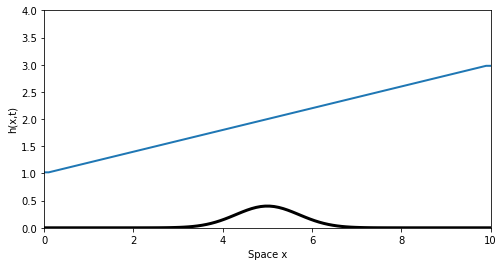

In [ ]:
## Display Eta function - non dry case

# Initial parameters
f = Bottom_f(x)
#h0 = 1.5 - f
h0 = eta_0(x) - f

# Solution
Eta = Rusanov_Solver(f, h0, t=0, dt = 0.005, tf=10, stepte=0.5)

# Display
anim = plot_variation(Eta, f)
HTML(anim.to_jshtml())

## Animation - dry state

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:50: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:54: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:50: RuntimeWarning: divide by zero encountered in true_divide
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:54: RuntimeWarning: divide by zero encountered in true_divide
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in true_divide
  # This is added back by InteractiveShellApp.init_path()
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:48: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:52: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:23: RuntimeWarning: inval

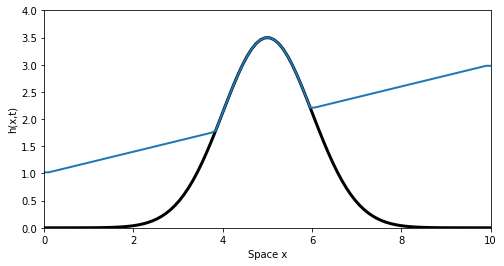

In [ ]:
## Display Eta function - dry case

# Initial parameters
f = Bottom_f4(x)
#h0 = 1.5 - f
h0 = eta_0(x) - f

# Solution
Eta = Rusanov_Solver_dry(f, h0, t=0, dt = 0.005, tf=3, stepte=0.1)

# Display
anim = plot_variation(Eta, f)
HTML(anim.to_jshtml())

One can see the left hand side behaves as expected, namely as HLL. However, it looks like it handles well the dry state to the left but to the right an error may have been made to the code. Nevertheless, as we did not find it in time, we don't make any further conclusion on Rusanov scheme. 

**To conclude on the dry state, let's now compare HLL to MacCormack.**

## Comparison HLL - MacCormack

We now aim to compare both methods in order to test this new scheme for a non flat topology and see how stable it is comparatively to MacCormack scheme.

In [ ]:
## Display Eta function

# Initial parameters
f = Bottom_f3(x)
h0 = eta_0(x) - f

# Solution
Eta_Hll = HLL_Solver(f, h0, t=0,dt = 0.005, tf=35, stepte=1)
Eta_Mac = MacCormack_Dry2(f, h0, t=0,dt = 0.005, tf=35, stepte=1)

# Display
anim=compare_anim(Eta_Hll,Eta_Mac, f, 'HLL', 'MacCormack2')  # Animate the solution
HTML(anim.to_jshtml())

IndexError: ignored

In [ ]:
## Display Eta function

# Initial parameters
f = np.zeros_like(x)
h0 = 2*(x<5)+0.0

# Solution
Eta_Hll = HLL_Solver(f, h0, t=0,dt = 0.005, tf=35, stepte=1)
Eta_Mac = MacCormack_Dry2(f, h0, t=0,dt = 0.005, tf=35, stepte=1)

# Display
anim=compare_anim(Eta_Hll,Eta_Mac, f, 'HLL', 'MacCormack2')  # Animate the solution
HTML(anim.to_jshtml())

**$\Rightarrow \underline{\text{Conclusion dry state}}$. We can conclude on the fact that HLL scheme presents neither a loss nor a creation of matter. As one would expect from an hyperbolic differential equation, the solver simply describes the motion of the matter, which is here of the type of a wave.**

**Moreover, the scheme as this presents presents no more dispersivity. To have worked on an exacte scheme (see hypotheses) brought the aimed stability, in normal or dry state.**

**This comparison concludes the step made to modelize dry state as well as shear stress and topology.**

In an other Google colab you will get the work made on 2D modelisation as well as the report conclusion, we then invite you to have a look at it.